# Human Action Recognition (HAR using Pretrained Newtorks and Transfer Learning

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# You should use mixed precision if you use TPUs or NVIDIA GPUs with at least compute capability 7.0, as it will improve performance by up to 3x.
# With this policy, layers use float16 computations and float32 variables. Computations are done in float16 for performance, but variables must be kept in float32 for numeric stability.
# IMPORTANT : A softmax activation at the end of the model should be float32.
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Overall Settings

In [ ]:
FINE_TUNING_EPOCHS = 15
TRAINING_EPOCHS = 5
BATCH_SIZE = 64

image_height = 224 #180
image_width = 224 #300

# Load data

In [ ]:
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/HAR_dataset.zip'

In [ ]:
import zipfile

# Specify the output directory where you want to unzip the file
output_dir = '/content/unzipped/HUMAN/'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print(f"File '{zip_file_path}' has been unzipped to '{output_dir}'.")


File '/content/drive/MyDrive/Colab Notebooks/HAR_dataset.zip' has been unzipped to '/content/unzipped/HUMAN/'.


In [ ]:
# path to the data files
main_path = "/content/unzipped/HUMAN/Human Action Recognition"

# Load data
test_df     = pd.read_csv("/content/unzipped/HUMAN/Human Action Recognition/Testing_set.csv")
training_df = pd.read_csv("/content/unzipped/HUMAN/Human Action Recognition/Training_set.csv")

In [ ]:
# Stratified Sampling
# Use groupby and apply to select sample
# which maintains the population group ratios
valid_df = training_df.groupby('label').apply(lambda x: x.sample(frac=0.10))
# There is one problem though - groupby() has added island as an index.
# Let’s drop the extra index using the Pandas__ method droplevel()__. Pass the parameter 0 as we want to drop the top level index.
valid_df = valid_df.droplevel(0)
# Creating dataframe with
# rest of the 90% values
train_df = training_df.drop(valid_df.index)

In [ ]:
training_df.head()

,filename,label
0,Image_1.jpg,sitting
1,Image_2.jpg,using_laptop
2,Image_3.jpg,hugging
3,Image_4.jpg,sleeping
4,Image_5.jpg,using_laptop


In [ ]:
freq = training_df['label'].value_counts()
train_freq = train_df['label'].value_counts()
valid_freq = valid_df['label'].value_counts()

print(freq,"\n\n", train_freq,"\n\n",valid_freq)
print()

sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: label, dtype: int64 

 sitting               756
using_laptop          756
sleeping              756
drinking              756
hugging               756
clapping              756
dancing               756
cycling               756
calling               756
laughing              756
eating                756
fighting              756
listening_to_music    756
running               756
texting               756
Name: label, dtype: int64 

 calling               84
clapping              84
cycling               84
dancing               84
drinking              84
eating                84
fighting    

In [ ]:
test_df.head()

,filename
0,Image_1.jpg
1,Image_2.jpg
2,Image_3.jpg
3,Image_4.jpg
4,Image_5.jpg


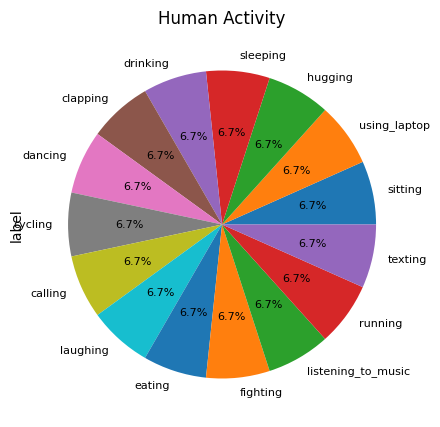

In [ ]:
freq.plot(kind='pie',figsize=(5,5),title='Human Activity',autopct='%1.1f%%',shadow = False,  fontsize=8);

# Data Generators

In [ ]:
# deep learning libraries
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image

In [ ]:
# Data agumentation and pre-processing using tensorflow
gen = ImageDataGenerator(rescale         = 1./255.,
                         horizontal_flip = True,
                         vertical_flip   = False,
                         zoom_range      = 0.05,
                         rotation_range  = 25)

train_generator = gen.flow_from_dataframe(
    train_df, # dataframe
    directory = main_path + "/train", # images data path / folder in which images are there
    x_col = 'filename',
    y_col = 'label',
    color_mode = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = True,
    seed = 42)

Found 11340 validated image filenames belonging to 15 classes.


In [ ]:
# Data agumentation and pre-processing using tensorflow
test_gen = ImageDataGenerator(rescale = 1./255.)

validation_generator = test_gen.flow_from_dataframe(
    valid_df, # dataframe
    directory   = main_path + "/train", # images data path / folder in which images are there
    x_col       = 'filename',
    y_col       = 'label',
    color_mode  ="rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    seed        = 42)

test_generator = test_gen.flow_from_dataframe(
    test_df, # dataframe
    directory   = main_path + "/test", # images data path / folder in which images are there
    x_col       = 'filename',
    #y_col       = 'labels',
    color_mode  = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode = None,
    batch_size  = BATCH_SIZE,
    shuffle  = False)

Found 1260 validated image filenames belonging to 15 classes.
Found 5400 validated image filenames.


In [ ]:
# Get labels in dataset
a = train_generator.class_indices
class_names = list(a.keys())  # storing class/breed names in a list

In [ ]:
class_names

['calling',
 'clapping',
 'cycling',
 'dancing',
 'drinking',
 'eating',
 'fighting',
 'hugging',
 'laughing',
 'listening_to_music',
 'running',
 'sitting',
 'sleeping',
 'texting',
 'using_laptop']

In [ ]:
# Define function to plot some images
import matplotlib.pyplot as plt

def plot_images(img, true_labels, predictions = None):
    plt.figure(figsize=[12, 18])
    for i in range(24):
        plt.subplot(6, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if (predictions is not None):
            if true_labels is not None:
                plt.title("{}\n {} {:.1f}%".format(class_names[np.argmax(true_labels[i])], class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
            else:
                plt.title("{} {:.1f}%".format(class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
        else:
            if true_labels is not None:
                plt.title(class_names[np.argmax(true_labels[i])])

# Sample Images

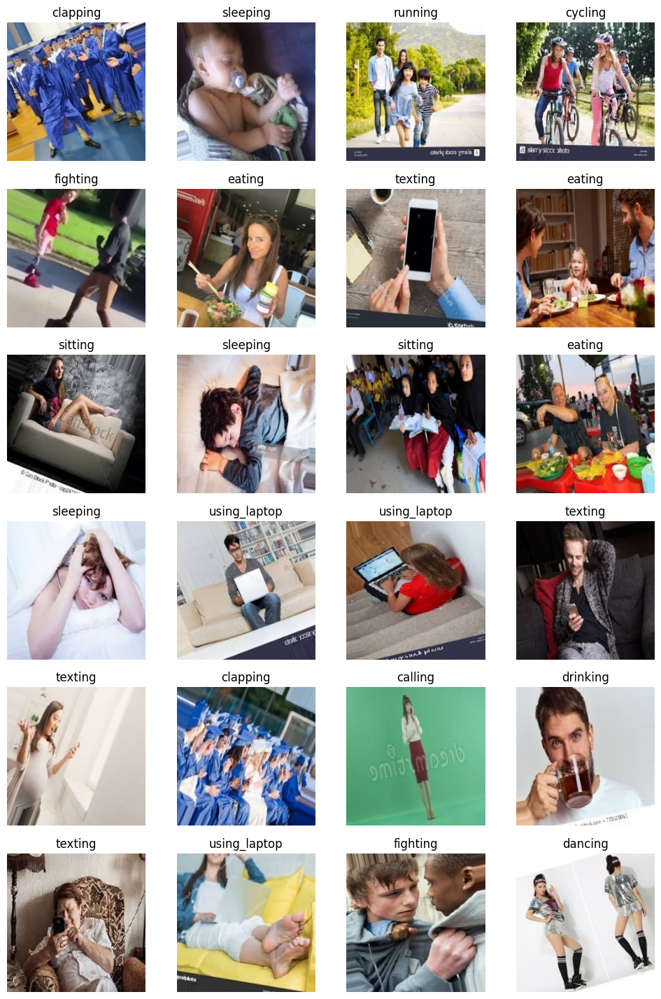

In [ ]:
x,y = next(train_generator)
plot_images(x,y)

In [ ]:
# function to plote training history
def plot_history(history):
    # store results
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # plot results
    # accuracy
    plt.figure(figsize=(5, 8))
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.grid'] = True
    plt.rcParams['figure.facecolor'] = 'white'
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')

    # loss
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')
    plt.xlabel('epoch')
    plt.tight_layout(pad=3.0)
    plt.show()

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_heatmap(y_true, y_pred, class_names, ax, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(
        cm,
        annot=True,
        square=True,
        xticklabels=class_names,
        yticklabels=class_names,
        fmt='d',
        cmap=plt.cm.Blues,
        cbar=False,
        ax=ax)
    ax.set_title(title, fontsize = 12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = "right")
    ax.set_ylabel('True Label', fontsize= 10)
    ax.set_xlabel('Predicted Label', fontsize = 10)

# Grad-Cam

In [ ]:
from matplotlib import cm

def make_gradcam_heatmap(image, model, last_conv_layer_name):

    img_array = tf.expand_dims(image, axis=0)

    # Remove last layer's softmax
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None

    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()


     # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # We create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img_array[0] * 255

    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)

    # Restore last layer activation
    model.layers[-1].activation = last_layer_activation

    return superimposed_img

# Model

In [ ]:
from tensorflow.keras.models import Model

def create_model(base_model):

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(64, activation = 'relu')(x)
    x = Dropout(0.2)(x)

    outputs = Dense(len(class_names), activation='softmax')(x)

    model = Model(base_model.inputs, outputs)

    return model

In [ ]:
def fit_model(model, base_model, epochs, fine_tune = 0):

    early = tf.keras.callbacks.EarlyStopping( patience = 8,
                                              min_delta = 0.001,
                                              restore_best_weights = True)
    # early stopping call back

    # Defines how many layers to freeze during training.
    # Layers in the convolutional base are switched from trainable to non-trainable
    # depending on the size of the fine-tuning parameter.

    print("Unfreezing number of layers in base model = ", fine_tune)

    if fine_tune > 0:
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False
        # small learning rate for fine tuning
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    else:
        base_model.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

    # categorical cross entropy is taken since its used as a loss function for
    # multi-class classification problems where there are two or more output labels.
    # using Adam optimizer for better performance
    # other optimizers such as sgd can also be used depending upon the model

    # fit model
    history = model.fit(train_generator,
                        validation_data = validation_generator,
                        epochs = epochs,
                        callbacks = [early])

    return history

# Inception

In [ ]:
# load the InceptionResNetV2 architecture with imagenet weights as base
inception_base_model = tf.keras.applications.InceptionResNetV2(
                     include_top = False,
                     weights = 'imagenet',
                     input_shape = (image_height, image_width, 3)
                     )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
inception_model = create_model(inception_base_model)
#inception_model.summary()
history = fit_model(inception_model, inception_base_model, epochs = TRAINING_EPOCHS)

219055592/219055592 [==============================] - 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/5
178/178 [==============================] - 188s 913ms/step - loss: 1.9959 - accuracy: 0.3637 - val_loss: 1.3870 - val_accuracy: 0.5921
Epoch 2/5
178/178 [==============================] - 156s 875ms/step - loss: 1.6071 - accuracy: 0.4830 - val_loss: 1.2488 - val_accuracy: 0.6325
Epoch 3/5
178/178 [==============================] - 154s 866ms/step - loss: 1.5026 - accuracy: 0.5294 - val_loss: 1.1853 - val_accuracy: 0.6492
Epoch 4/5
178/178 [==============================] - 156s 874ms/step - loss: 1.4353 - accuracy: 0.5476 - val_loss: 1.1360 - val_accuracy: 0.6587
Epoch 5/5
178/178 [==============================] - 154s 864ms/step - loss: 1.3737 - accuracy: 0.5697 - val_loss: 1.1385 - val_accuracy: 0.6683


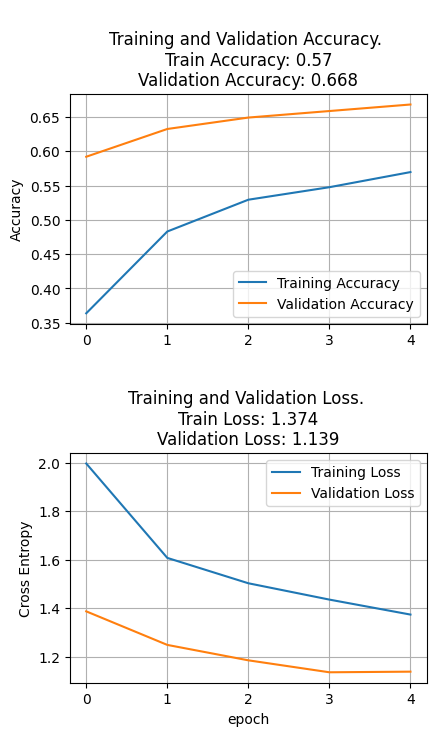

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze the base_model
nr_base_layers = len(inception_base_model.layers)
print("Inception base layers = ", nr_base_layers)

history = fit_model(inception_model, inception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

Inception base layers =  780
Unfreezing number of layers in base model =  195
Epoch 1/15
178/178 [==============================] - 201s 905ms/step - loss: 1.4723 - accuracy: 0.5604 - val_loss: 1.1023 - val_accuracy: 0.6714
Epoch 2/15
178/178 [==============================] - 158s 886ms/step - loss: 1.2799 - accuracy: 0.6056 - val_loss: 1.0469 - val_accuracy: 0.6865
Epoch 3/15
178/178 [==============================] - 160s 899ms/step - loss: 1.1936 - accuracy: 0.6320 - val_loss: 1.0007 - val_accuracy: 0.6992
Epoch 4/15
178/178 [==============================] - 158s 887ms/step - loss: 1.1255 - accuracy: 0.6556 - val_loss: 0.9694 - val_accuracy: 0.7016
Epoch 5/15
178/178 [==============================] - 160s 901ms/step - loss: 1.0847 - accuracy: 0.6683 - val_loss: 0.9440 - val_accuracy: 0.7143
Epoch 6/15
178/178 [==============================] - 159s 893ms/step - loss: 1.0293 - accuracy: 0.6888 - val_loss: 0.9253 - val_accuracy: 0.7222
Epoch 7/15
178/178 [==========================

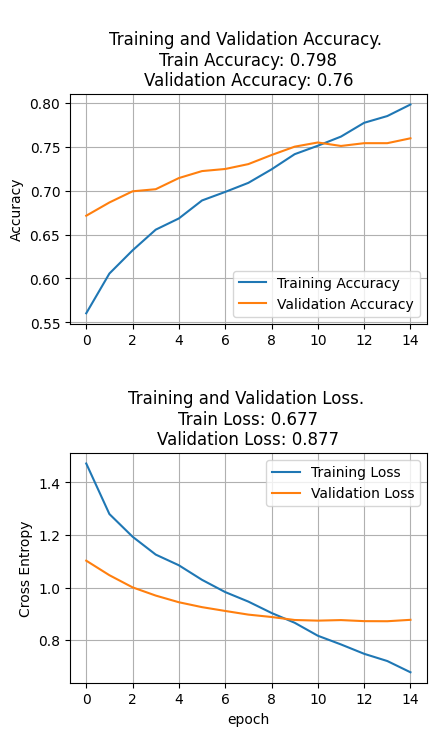

In [ ]:
 plot_history(history)

In [ ]:
accuracy_score = inception_model.evaluate(validation_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 3s 150ms/step - loss: 0.8770 - accuracy: 0.7595
[0.8770166635513306, 0.7595238089561462]
Accuracy: 75.95%
Loss: 0.877


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
validation_generator.reset()
inception_val_preds = inception_model.predict(validation_generator)
inception_val_pred_classes = np.argmax(inception_val_preds, axis=1)

20/20 [==============================] - 8s 159ms/step


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()
inception_test_preds = inception_model.predict(test_generator)
inception_test_pred_classes = np.argmax(inception_test_preds, axis=1)

85/85 [==============================] - 19s 181ms/step


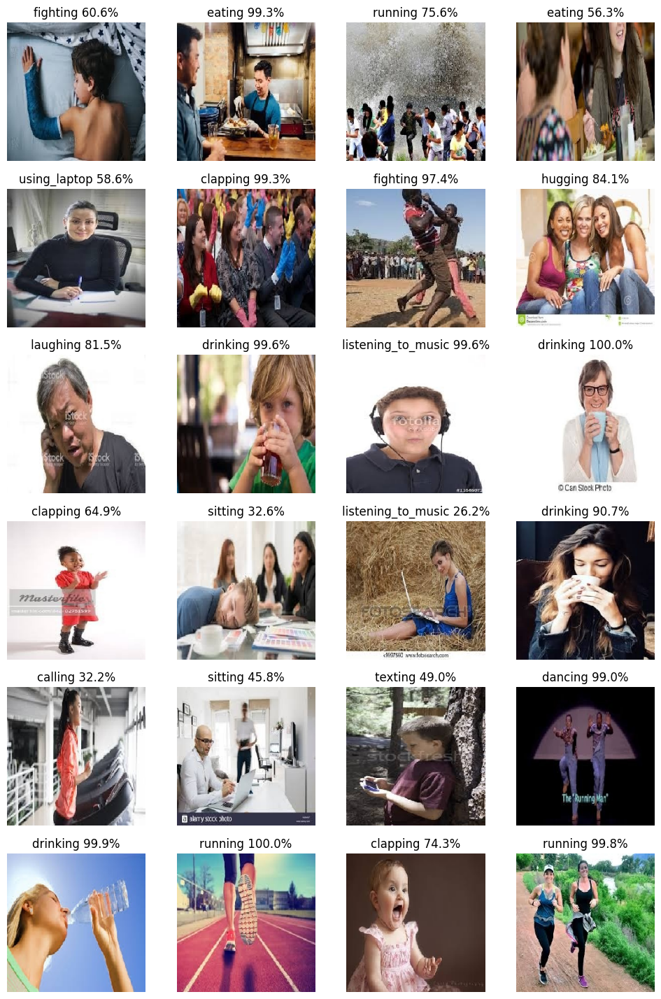

In [ ]:
test_generator.reset()
x = next(test_generator)
plot_images(x, None, inception_test_preds)

<ipython-input-21-7273e6d766a1>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


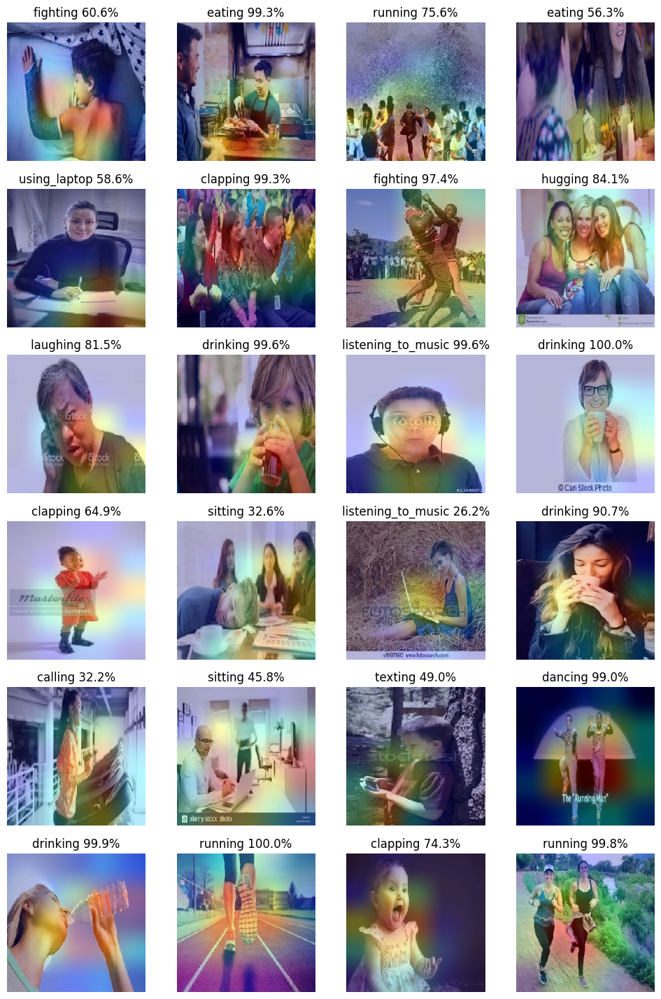

In [ ]:
last_conv_layer_name = "conv_7b_ac"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, inception_model, last_conv_layer_name)
    heatmaps.append(heatmap)

plot_images(heatmaps, None, inception_test_preds)

# VGG16

In [ ]:
# load the VGG16 architecture with imagenet weights as base
vgg16_base_model = tf.keras.applications.vgg16.VGG16(
                             include_top = False,
                             weights = 'imagenet',
                             input_shape = (image_height, image_width, 3)
                             )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
vgg16_model = create_model(vgg16_base_model)
#vgg16_model.summary()
history = fit_model(vgg16_model, vgg16_base_model, epochs = TRAINING_EPOCHS)

58889256/58889256 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/5
178/178 [==============================] - 159s 851ms/step - loss: 2.5760 - accuracy: 0.1526 - val_loss: 2.2438 - val_accuracy: 0.2738
Epoch 2/5
178/178 [==============================] - 154s 863ms/step - loss: 2.2000 - accuracy: 0.2675 - val_loss: 1.9339 - val_accuracy: 0.3508
Epoch 3/5
178/178 [==============================] - 161s 903ms/step - loss: 2.0415 - accuracy: 0.3187 - val_loss: 1.8123 - val_accuracy: 0.4079
Epoch 4/5
178/178 [==============================] - 154s 866ms/step - loss: 1.9612 - accuracy: 0.3494 - val_loss: 1.7434 - val_accuracy: 0.4317
Epoch 5/5
178/178 [==============================] - 153s 860ms/step - loss: 1.9003 - accuracy: 0.3731 - val_loss: 1.7374 - val_accuracy: 0.4254


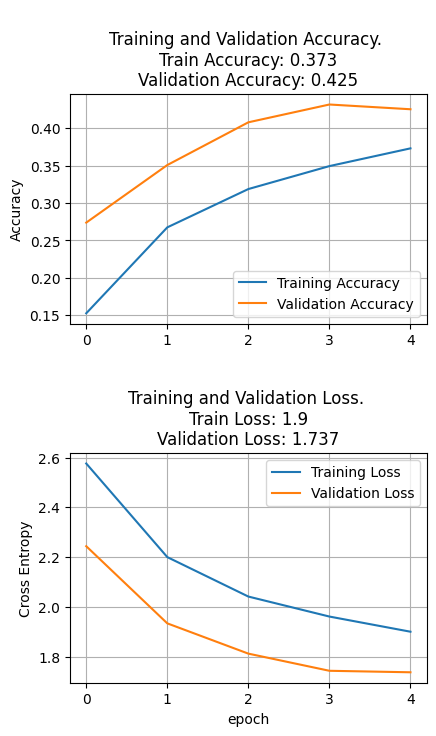

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(vgg16_base_model.layers)
print("VGG16 base layers = ", nr_base_layers)

history = fit_model(vgg16_model, vgg16_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

VGG16 base layers =  19
Unfreezing number of layers in base model =  4
Epoch 1/15
178/178 [==============================] - 165s 900ms/step - loss: 1.8088 - accuracy: 0.4071 - val_loss: 1.5979 - val_accuracy: 0.4810
Epoch 2/15
178/178 [==============================] - 153s 859ms/step - loss: 1.7269 - accuracy: 0.4308 - val_loss: 1.5436 - val_accuracy: 0.4976
Epoch 3/15
178/178 [==============================] - 154s 864ms/step - loss: 1.6657 - accuracy: 0.4513 - val_loss: 1.5117 - val_accuracy: 0.5048
Epoch 4/15
178/178 [==============================] - 149s 835ms/step - loss: 1.6164 - accuracy: 0.4639 - val_loss: 1.5254 - val_accuracy: 0.4976
Epoch 5/15
178/178 [==============================] - 154s 866ms/step - loss: 1.5758 - accuracy: 0.4807 - val_loss: 1.4602 - val_accuracy: 0.5127
Epoch 6/15
178/178 [==============================] - 155s 869ms/step - loss: 1.5565 - accuracy: 0.4862 - val_loss: 1.4200 - val_accuracy: 0.5381
Epoch 7/15
178/178 [==============================] -

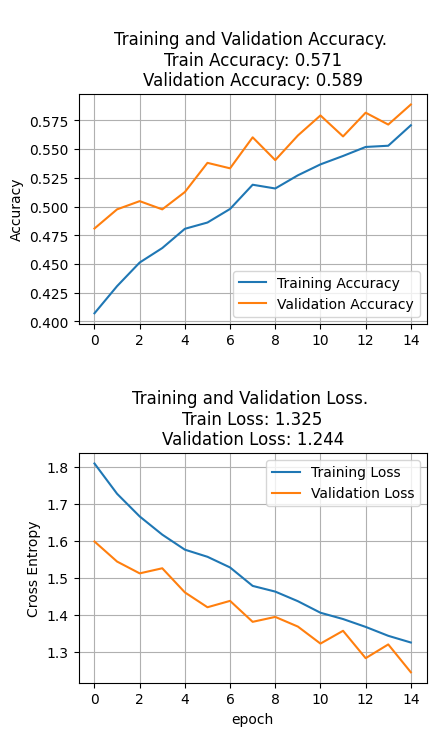

In [ ]:
plot_history(history)

In [ ]:
accuracy_score = vgg16_model.evaluate(validation_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 3s 146ms/step - loss: 1.2442 - accuracy: 0.5889
[1.24415922164917, 0.5888888835906982]
Accuracy: 58.89%
Loss: 1.244


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
validation_generator.reset()

vgg16_val_preds = vgg16_model.predict(validation_generator)
vgg16_val_pred_classes = np.argmax(vgg16_val_preds, axis=1)

20/20 [==============================] - 3s 122ms/step


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

vgg16_test_preds = vgg16_model.predict(test_generator)
vgg16_test_pred_classes = np.argmax(vgg16_test_preds, axis=1)

85/85 [==============================] - 16s 184ms/step


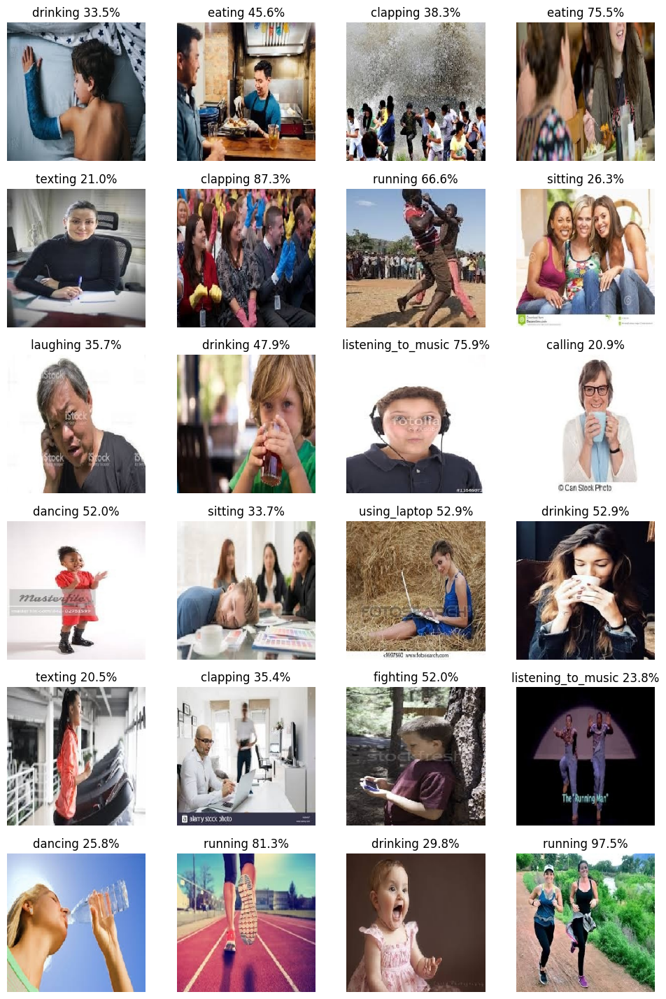

In [ ]:
test_generator.reset()
x = next(test_generator)
plot_images(x, None, vgg16_test_preds)

<ipython-input-21-7273e6d766a1>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


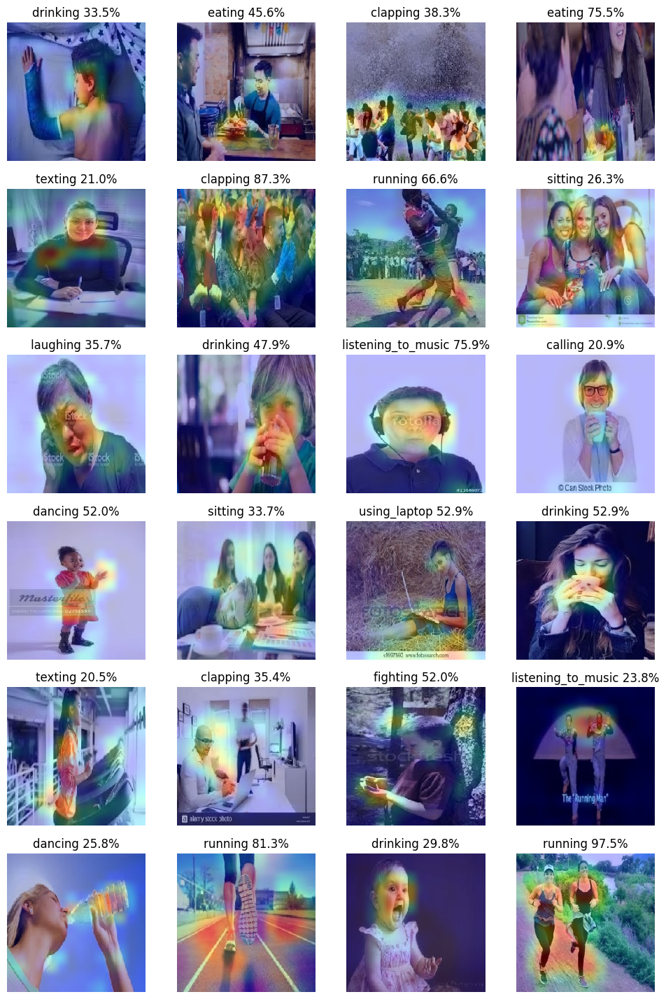

In [ ]:
last_conv_layer_name = "block5_conv3"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, vgg16_model, last_conv_layer_name)
    heatmaps.append(heatmap)

plot_images(heatmaps, None, vgg16_test_preds)

# Xception

In [ ]:
# resnet_base_model = tf.keras.applications.resnet.ResNet50(
#                                  include_top=False,
#                                  weights='imagenet',
#                                  input_shape=(image_height, image_width, 3)
#                                  )

# # For freezing the layer we make use of layer.trainable = False
# # means that its internal state will not change during training.
# # model's trainable weights will not be updated during fit(),
# # and also its state updates will not run.
# resnet_model = create_model(resnet_base_model)
# #xception_model.summary()
# history = fit_model(resnet_model, resnet_base_model, epochs = TRAINING_EPOCHS)

# load the xception architecture with imagenet weights as base
xception_base_model = tf.keras.applications.xception.Xception(
                                 include_top = False,
                                 weights = 'imagenet',
                                 input_shape = (image_height, image_width, 3)
                                 )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
xception_model = create_model(xception_base_model)
#xception_model.summary()
history = fit_model(xception_model, xception_base_model, epochs = TRAINING_EPOCHS)

83683744/83683744 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/5
178/178 [==============================] - 160s 861ms/step - loss: 1.9315 - accuracy: 0.3781 - val_loss: 1.3146 - val_accuracy: 0.5960
Epoch 2/5
178/178 [==============================] - 151s 849ms/step - loss: 1.5384 - accuracy: 0.5035 - val_loss: 1.1798 - val_accuracy: 0.6373
Epoch 3/5
178/178 [==============================] - 152s 849ms/step - loss: 1.4488 - accuracy: 0.5398 - val_loss: 1.1712 - val_accuracy: 0.6397
Epoch 4/5
178/178 [==============================] - 153s 863ms/step - loss: 1.3758 - accuracy: 0.5640 - val_loss: 1.1355 - val_accuracy: 0.6452
Epoch 5/5
178/178 [==============================] - 152s 857ms/step - loss: 1.3420 - accuracy: 0.5691 - val_loss: 1.1297 - val_accuracy: 0.6373


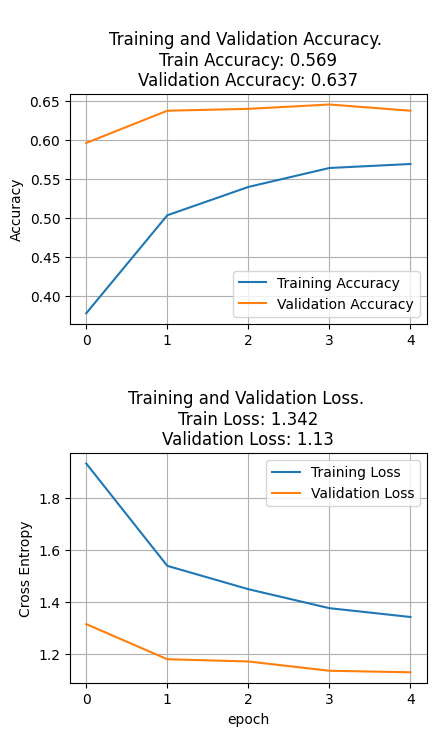

In [ ]:
plot_history(history)

In [ ]:
# # Unfreeze the base_model. Note that it keeps running in inference mode
# # since we passed `training=False` when calling it. This means that
# # the batchnorm layers will not update their batch statistics.
# # This prevents the batchnorm layers from undoing all the training
# # we've done so far.
# nr_base_layers = len(resnet_base_model.layers)
# print("Resnet base layers = ", nr_base_layers)

# history = fit_model(resnet_model, resnet_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(xception_base_model.layers)
print("xception base layers = ", nr_base_layers)

history = fit_model(xception_model, xception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

xception base layers =  132
Unfreezing number of layers in base model =  33
Epoch 1/15
178/178 [==============================] - 162s 838ms/step - loss: 1.5433 - accuracy: 0.5228 - val_loss: 1.1696 - val_accuracy: 0.6413
Epoch 2/15
178/178 [==============================] - 151s 847ms/step - loss: 1.3357 - accuracy: 0.5854 - val_loss: 1.0826 - val_accuracy: 0.6651
Epoch 3/15
178/178 [==============================] - 153s 859ms/step - loss: 1.2652 - accuracy: 0.6054 - val_loss: 1.0468 - val_accuracy: 0.6794
Epoch 4/15
178/178 [==============================] - 160s 902ms/step - loss: 1.2105 - accuracy: 0.6199 - val_loss: 1.0251 - val_accuracy: 0.6873
Epoch 5/15
178/178 [==============================] - 154s 867ms/step - loss: 1.1629 - accuracy: 0.6325 - val_loss: 0.9989 - val_accuracy: 0.7024
Epoch 6/15
178/178 [==============================] - 153s 862ms/step - loss: 1.1275 - accuracy: 0.6510 - val_loss: 0.9737 - val_accuracy: 0.7048
Epoch 7/15
178/178 [============================

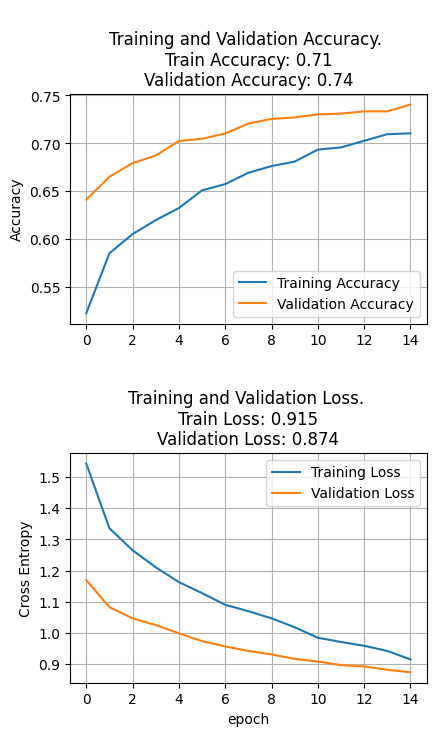

In [ ]:
plot_history(history)

In [ ]:
# accuracy_score = resnet_model.evaluate(validation_generator)

# print(accuracy_score)
# print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
# print("Loss: {:.3f}".format(accuracy_score[0]))
accuracy_score = xception_model.evaluate(validation_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 3s 142ms/step - loss: 0.8738 - accuracy: 0.7405
[0.8737909197807312, 0.7404761910438538]
Accuracy: 74.05%
Loss: 0.874


In [ ]:
# # Perform predictions to allow computation of the confusion matrix later on
# # Do not shuffle predictions otherwise we have no way of finding out the true labels
# validation_generator.reset()

# resnet_val_preds = resnet_model.predict(validation_generator)
# resnet_val_pred_classes = np.argmax(resnet_val_preds, axis = 1)

# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
validation_generator.reset()

xception_val_preds = xception_model.predict(validation_generator)
xception_val_pred_classes = np.argmax(xception_val_preds, axis = 1)


20/20 [==============================] - 4s 145ms/step


In [ ]:
# # Perform predictions to allow computation of the confusion matrix later on
# # Do not shuffle predictions otherwise we have no way of finding out the true labels
# test_generator.reset()

# resnet_test_preds = resnet_model.predict(test_generator)
# resnet_test_pred_classes = np.argmax(resnet_test_preds, axis = 1)

# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

xception_test_preds = xception_model.predict(test_generator)
xception_test_pred_classes = np.argmax(xception_test_preds, axis = 1)

85/85 [==============================] - 15s 163ms/step


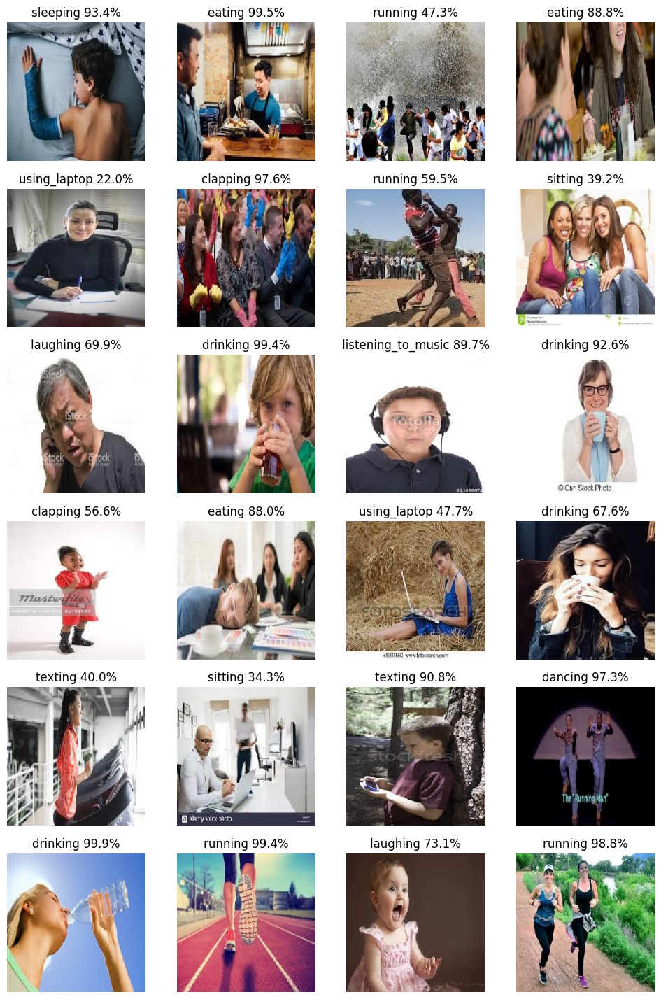

In [ ]:
# test_generator.reset()
# x = next(test_generator)
# plot_images(x, None, resnet_test_preds)

test_generator.reset()
x = next(test_generator)
plot_images(x, None, xception_test_preds)

<ipython-input-21-7273e6d766a1>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


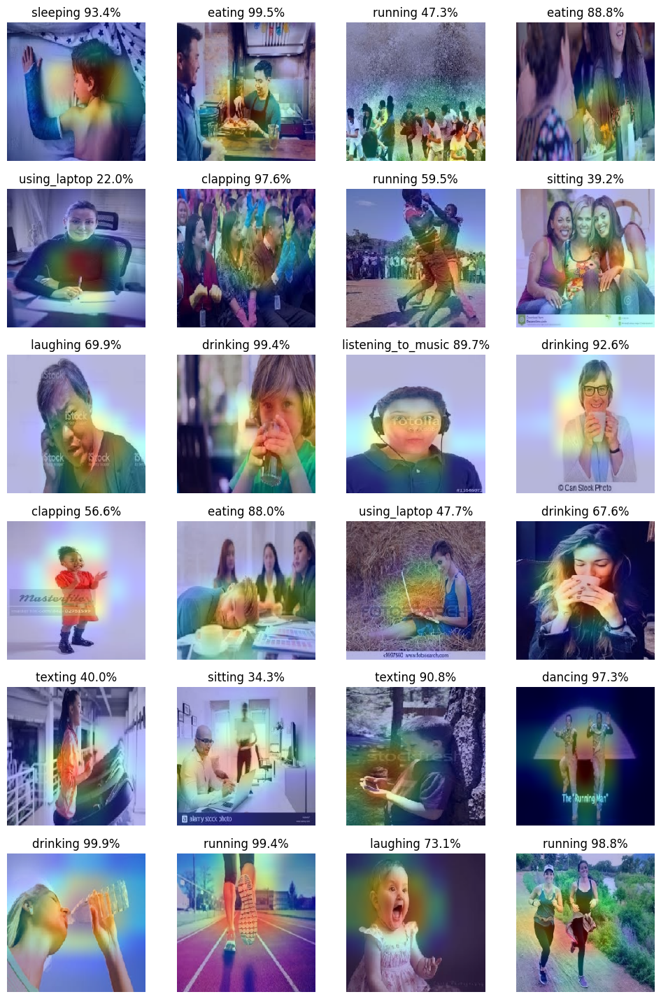

In [ ]:
# last_conv_layer_name = "block14_sepconv2_act"

# heatmaps = []

# for img in x:
#     heatmap = make_gradcam_heatmap(img, resnet_model, last_conv_layer_name)
#     heatmaps.append(heatmap)

# plot_images(heatmaps, None, resnet_test_preds)

last_conv_layer_name = "block14_sepconv2_act"

heatmaps = []

for img in x:
    heatmap = make_gradcam_heatmap(img, xception_model, last_conv_layer_name)
    heatmaps.append(heatmap)

plot_images(heatmaps, None, xception_test_preds)

# Confusion Matrix

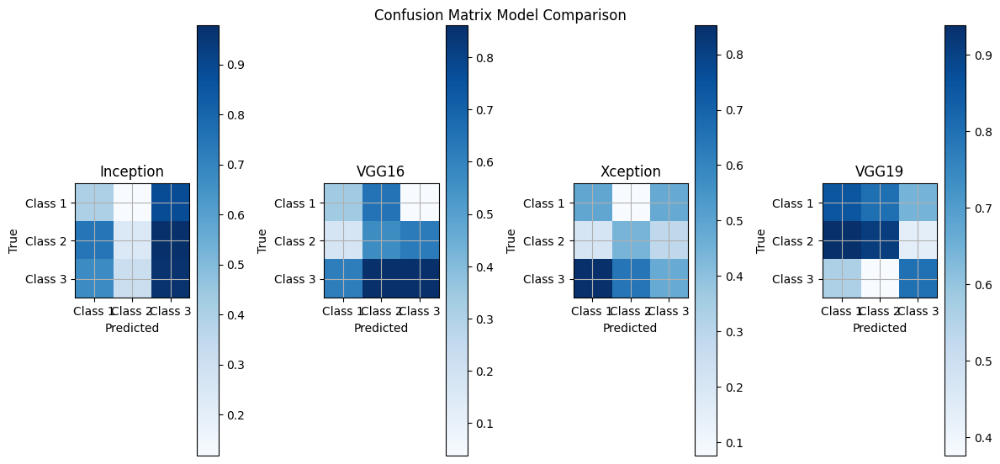

In [ ]:

# Display confusion matrix
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 8))

true_classes = validation_generator.classes

plot_heatmap(true_classes, inception_val_pred_classes, class_names, ax1, title = "Inception")
plot_heatmap(true_classes, vgg16_val_pred_classes, class_names, ax2, title = "VGG16")
plot_heatmap(true_classes, xception_val_pred_classes, class_names, ax3, title = "Xception")
plot_heatmap(true_classes, vgg19_val_pred_classes, class_names, ax4, title = "VGG19")


fig.suptitle("Confusion Matrix Model Comparison", fontsize = 12)
fig.tight_layout()
fig.subplots_adjust(top=1.25)
plt.show()

In [ ]:
inception_model.save('inception_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# VGG 19

In [ ]:
import tensorflow as tf

# Define the input shape (image dimensions)
#image_height, image_width = 224, 224  # You can adjust these dimensions

# Load the VGG19 architecture with ImageNet weights as the base model
vgg19_base_model = tf.keras.applications.vgg19.VGG19(
    include_top=False,  # Exclude the top (output) layers
    weights='imagenet',  # Initialize with ImageNet weights
    input_shape=(image_height, image_width, 3)  # Input image dimensions
)

vgg19_model = create_model(vgg19_base_model)

# Optionally, you can print the model summary to see the architecture
vgg19_model.summary()

# Define the number of training epochs (TRAINING_EPOCHS) and other training parameters

# Now, you can fit (train) your VGG19-based model using your dataset:
history = fit_model(vgg19_model, vgg19_base_model, epochs=TRAINING_EPOCHS)


80134624/80134624 [==============================] - 1s 0us/step
Model: "model_195"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                          

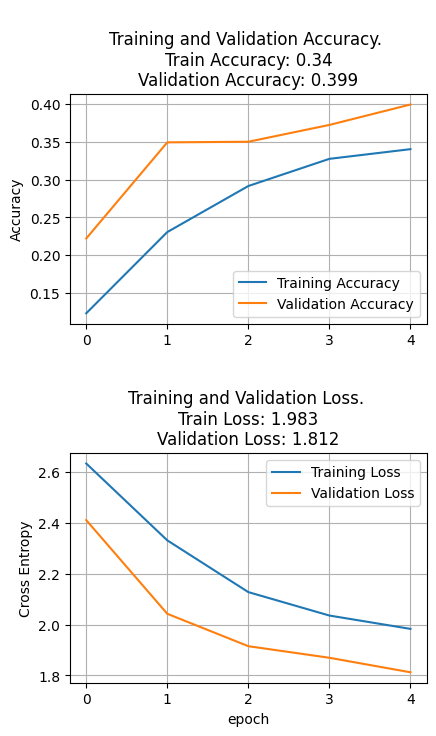

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze the base_model
vgg19_base_model.trainable = True

# Calculate the number of layers in the VGG19 base model
nr_base_layers = len(vgg19_base_model.layers)
print("VGG19 base layers =", nr_base_layers)


# Fine-tune the model
history = fit_model(vgg19_model, vgg19_base_model, epochs=FINE_TUNING_EPOCHS, fine_tune=int(nr_base_layers/4))


VGG19 base layers = 22
Unfreezing number of layers in base model =  5
Epoch 1/15
178/178 [==============================] - 188s 1s/step - loss: 1.8815 - accuracy: 0.3748 - val_loss: 1.6885 - val_accuracy: 0.4357
Epoch 2/15
178/178 [==============================] - 171s 959ms/step - loss: 1.7688 - accuracy: 0.4089 - val_loss: 1.6066 - val_accuracy: 0.4635
Epoch 3/15
178/178 [==============================] - 156s 879ms/step - loss: 1.7126 - accuracy: 0.4297 - val_loss: 1.5800 - val_accuracy: 0.4849
Epoch 4/15
178/178 [==============================] - 155s 871ms/step - loss: 1.6640 - accuracy: 0.4486 - val_loss: 1.5259 - val_accuracy: 0.4865
Epoch 5/15
178/178 [==============================] - 155s 873ms/step - loss: 1.6215 - accuracy: 0.4574 - val_loss: 1.5434 - val_accuracy: 0.4921
Epoch 6/15
178/178 [==============================] - 156s 876ms/step - loss: 1.5786 - accuracy: 0.4772 - val_loss: 1.4527 - val_accuracy: 0.5246
Epoch 7/15
178/178 [==============================] - 154

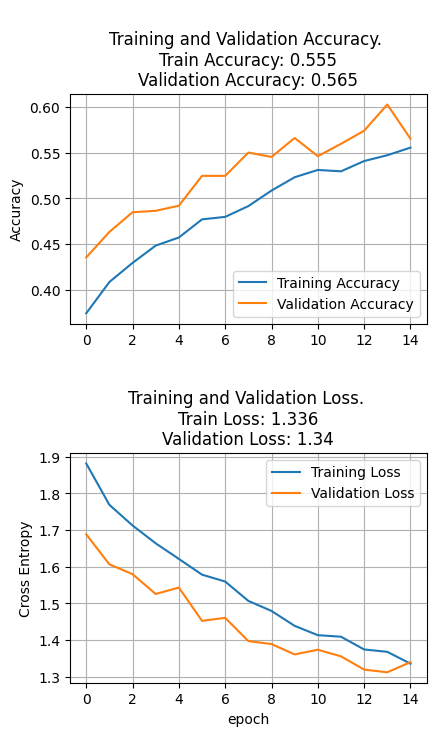

In [ ]:
plot_history(history)

In [ ]:
accuracy_loss = vgg19_model.evaluate(validation_generator)

# The evaluate() function returns both loss and accuracy by default
loss, accuracy = accuracy_loss

print("Accuracy: {:.2f}%".format(accuracy * 100))
print("Loss: {:.3f}".format(loss))


20/20 [==============================] - 4s 183ms/step - loss: 1.3402 - accuracy: 0.5651
Accuracy: 56.51%
Loss: 1.340


In [ ]:
validation_generator.reset()

vgg19_val_preds = vgg19_model.predict(validation_generator)
vgg19_val_pred_classes = np.argmax(vgg19_val_preds, axis = 1)

20/20 [==============================] - 3s 152ms/step


In [ ]:
test_generator.reset()

vgg19_test_preds = vgg19_model.predict(test_generator)
vgg19_test_pred_classes = np.argmax(vgg19_test_preds, axis = 1)

85/85 [==============================] - 14s 166ms/step


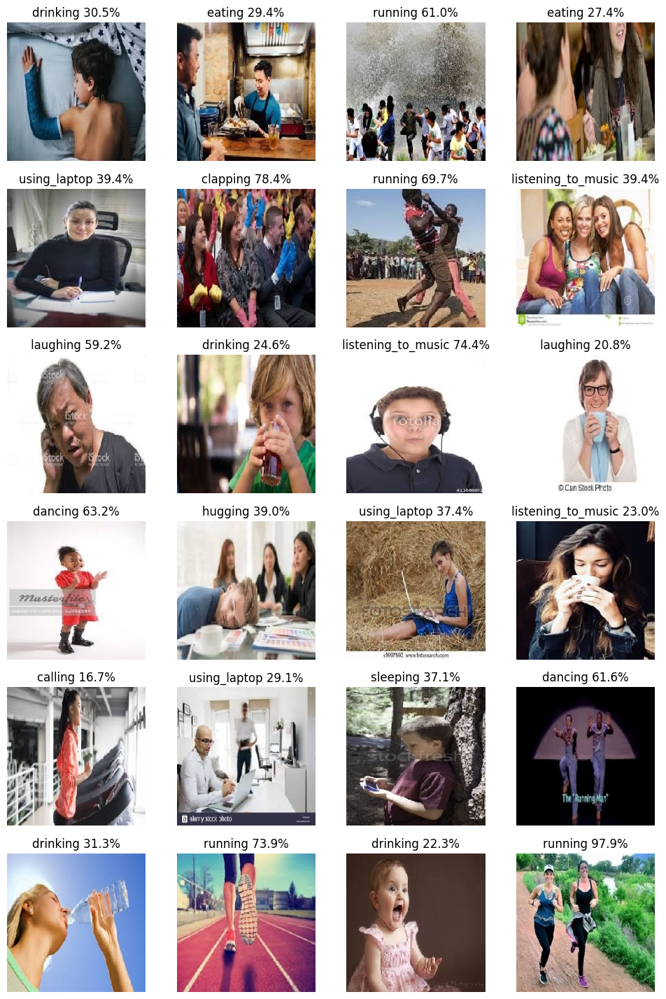

In [ ]:
test_generator.reset()
x = next(test_generator)
plot_images(x, None, vgg19_test_preds)

<ipython-input-21-7273e6d766a1>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


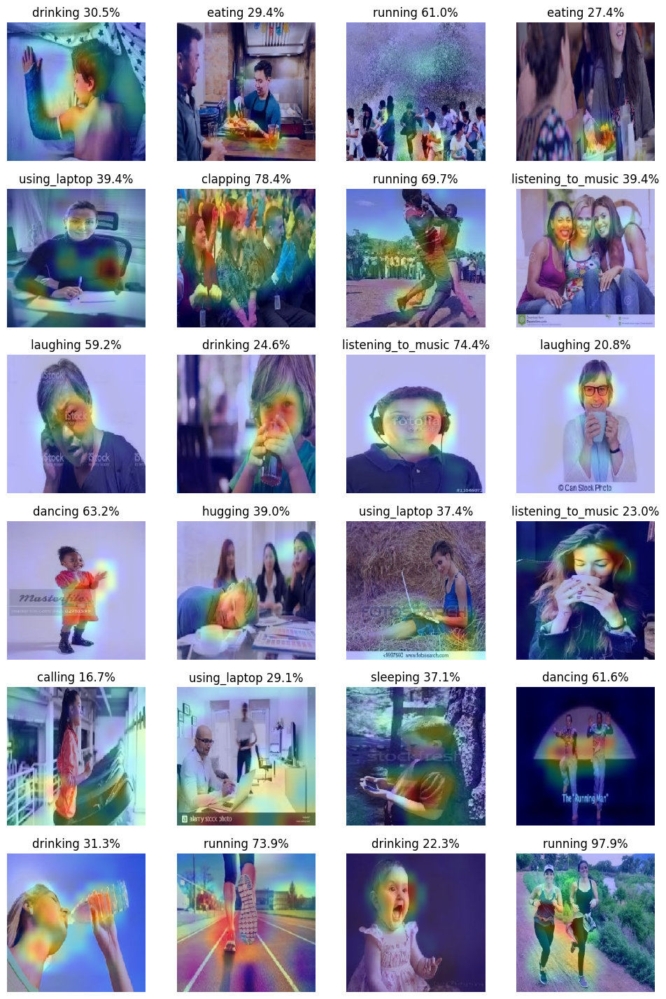

In [ ]:
last_conv_layer_name = "block5_conv4"  # This is an example, you should specify the actual last convolutional layer of VGG19

heatmaps = []

for img in x:
    heatmap = make_gradcam_heatmap(img, vgg19_model, last_conv_layer_name)
    heatmaps.append(heatmap)

plot_images(heatmaps, None, vgg19_test_preds)
